In [ ]:
# clone repo
!git clone https://github.com/TheoXiong7/CS445_FinalProject.git

# move 'data' folder to current dir
!mv CS445_FinalProject/data .

# cleanup
!rm -rf CS445_FinalProject

In [10]:
import torch
import numpy as np
import pandas as pd
import time
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import os
import glob


from style_transfer import stylize_image
from depth_aware_style_transfer import load_precomputed_masks, blend_stylized_layers, visualize_depth_layers

from pathlib import Path
from pprint import pprint
from eval import evaluate_stylization, load_lpips_model

print('done')

done


In [11]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

Using device: cuda


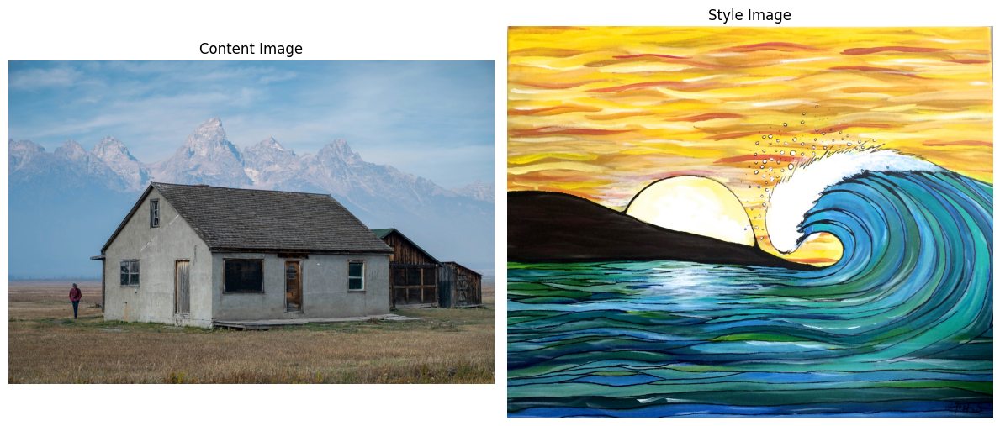

In [12]:
# load content & style
dataset_path = 'data'

content_name = 'house'
style_name = 'style_2'

content_path = os.path.join(dataset_path, 'images', f'{content_name}.jpg')
style_path = os.path.join(dataset_path, 'styles', f'{style_name}.jpg')

content_img = Image.open(content_path)
style_img = Image.open(style_path)

content_np = np.array(content_img)
output_size = 720
ratio = output_size / max(content_img.size)
new_h = int(content_img.size[1] * ratio)
new_w = int(content_img.size[0] * ratio)
target_shape = (new_h, new_w)

# load pre-computed masks for house.jpg
masks = load_precomputed_masks(
    mask_dir=os.path.join(dataset_path, 'masks'),
    image_name=content_name,
    target_shape=target_shape,
    feather_radius=15
)

# plot
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(content_img)
axes[0].set_title('Content Image')
axes[0].axis('off')
axes[1].imshow(style_img)
axes[1].set_title('Style Image')
axes[1].axis('off')
plt.tight_layout()
plt.show()

Running baseline style transfer...
Content image shape: torch.Size([1, 3, 479, 720])
Style image shape: torch.Size([1, 3, 479, 720])
Device: cuda
Running style transfer for 300 steps...
Step 50: Content Loss: 0.5506, Style Loss: 1.1163
Step 100: Content Loss: 0.4566, Style Loss: 0.4668
Step 150: Content Loss: 0.4323, Style Loss: 0.3611
Step 200: Content Loss: 0.4310, Style Loss: 0.3503
Step 250: Content Loss: 0.6615, Style Loss: 0.6713
Step 300: Content Loss: 0.8663, Style Loss: 0.7493
Time used: 14.67


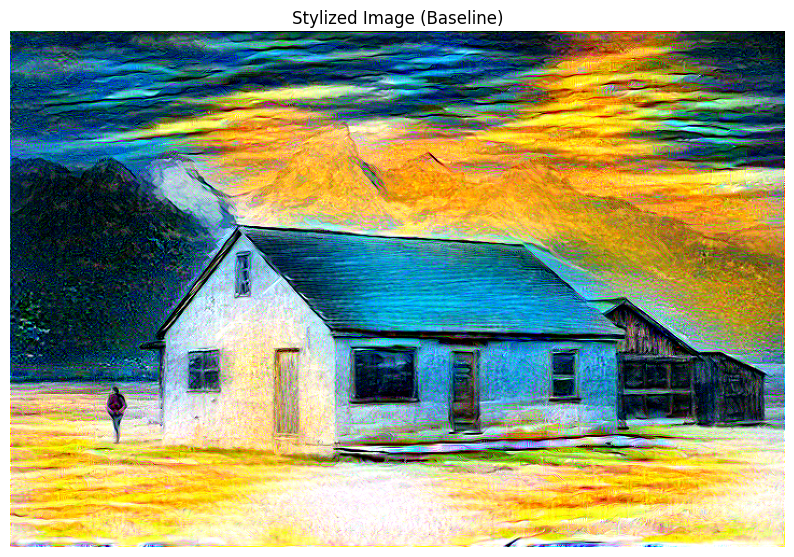

In [13]:
# BASELINE
start_time = time.time()
print("Running baseline style transfer...")
stylized_baseline = stylize_image(
    content_path=content_path,
    style_path=style_path,
    output_size=output_size,
    num_steps=300,
    style_weight=1e4,
    content_weight=1,
    verbose=True
)
print(f'Time used: {round(time.time() - start_time, 2)}')
# plot result
plt.figure(figsize=(10, 8))
plt.imshow(stylized_baseline)
plt.title('Stylized Image (Baseline)')
plt.axis('off')
plt.show()

Time used: 0.01


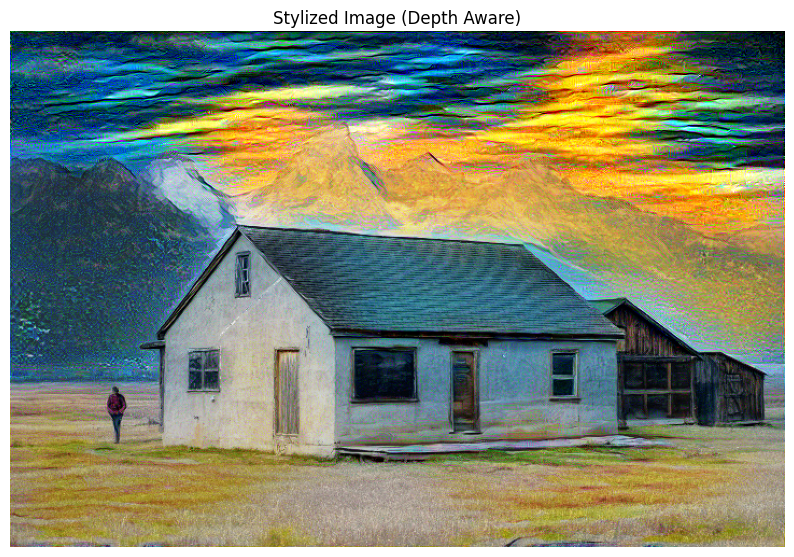

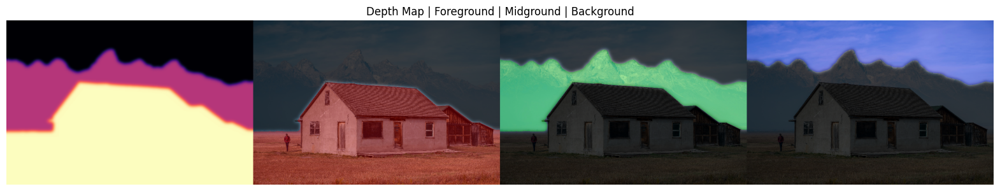

In [14]:
# DEPTH AWARE

# load pre-computed masks for house.jpg
masks = load_precomputed_masks(
    mask_dir=os.path.join(dataset_path, 'masks'),
    image_name='house',
    target_shape=target_shape,
    feather_radius=15
)

# resize content and stylized to target shape
content_resized = cv2.resize(content_np, (new_w, new_h))
if stylized_baseline.shape[:2] != (new_h, new_w):
    stylized_resized = cv2.resize(stylized_baseline, (new_w, new_h))
else:
    stylized_resized = stylized_baseline

# Blend with depth-aware style strengths
style_strengths = {
    'foreground': 0.4,
    'midground': 0.7,
    'background': 1.0
}

stylized_layers = {
    'foreground': stylized_resized,
    'midground': stylized_resized,
    'background': stylized_resized
}

start_time = time.time()
stylized_depth = blend_stylized_layers(
    content_resized, stylized_layers, masks, style_strengths
)
print(f'Time used: {round(time.time() - start_time, 2)}')

# Create depth visualization (use masks to create a pseudo depth map)
depth_map = (masks['foreground'] * 1.0 +
             masks['midground'] * 0.5 +
             masks['background'] * 0.0)

vis = visualize_depth_layers(content_resized, depth_map, masks)

# plot result
plt.figure(figsize=(10, 8))
plt.imshow(stylized_depth)
plt.title('Stylized Image (Depth Aware)')
plt.axis('off')
plt.show()

# plot depth layers
plt.figure(figsize=(20, 5))
plt.imshow(vis)
plt.title('Depth Map | Foreground | Midground | Background')
plt.axis('off')
plt.show()

In [15]:
# BATCH PROCESSING: All content images x all styles with pre-computed masks
import os
import glob
import time
# from tqdm.notebook import tqdm <-- windows compatibility BS; feel free to uncomment when needed
from tqdm import tqdm

from depth_aware_style_transfer import (
    load_precomputed_masks,
    depth_aware_style_transfer_with_masks,
    blend_stylized_layers
)
from style_transfer import stylize_image

# Configuration
DATA_DIR = 'data'
IMAGES_DIR = os.path.join(DATA_DIR, 'images')
STYLES_DIR = os.path.join(DATA_DIR, 'styles')
MASKS_DIR = os.path.join(DATA_DIR, 'masks')
RESULTS_DIR = 'results'

OUTPUT_SIZE = 512
NUM_STEPS = 200
STYLE_WEIGHT = 1e4
CONTENT_WEIGHT = 1
FEATHER_RADIUS = 15

STYLE_STRENGTHS = {
    'foreground': 0.4,
    'midground': 0.7,
    'background': 1.0
}

# Create results directory structure
os.makedirs(RESULTS_DIR, exist_ok=True)
os.makedirs(os.path.join(RESULTS_DIR, 'baseline'), exist_ok=True)
os.makedirs(os.path.join(RESULTS_DIR, 'depth_aware'), exist_ok=True)

# Get all content images and styles
content_files = sorted(glob.glob(os.path.join(IMAGES_DIR, '*.jpg')) +
                       glob.glob(os.path.join(IMAGES_DIR, '*.png')))
style_files = sorted(glob.glob(os.path.join(STYLES_DIR, '*.jpg')) +
                     glob.glob(os.path.join(STYLES_DIR, '*.png')))

print(f"Found {len(content_files)} content images")
print(f"Found {len(style_files)} style images")
print(f"Total combinations: {len(content_files) * len(style_files)}")

# Preview what we're working with
if content_files:
    print(f"\nContent images: {[os.path.basename(f) for f in content_files[:5]]}...")
if style_files:
    print(f"Style images: {[os.path.basename(f) for f in style_files]}")

Found 100 content images
Found 5 style images
Total combinations: 500

Content images: ['archway.jpg', 'aztec-pyramid.jpg', 'baby-elephant.jpg', 'badroom.jpg', 'bar.jpg']...
Style images: ['style_1.jpg', 'style_2.jpg', 'style_3.jpg', 'style_4.jpg', 'style_5.jpg']


In [8]:
# Run batch processing

def process_batch():
    """Process all content-style combinations."""
    results_log = []
    total = len(content_files) * len(style_files)

    if total == 0:
        print("No files to process! Make sure data/images/ and data/styles/ contain images.")
        return results_log

    start_time = time.time()

    with tqdm(total=total * 2, desc="Processing") as pbar:  # x2 for baseline + depth-aware
        for content_path in content_files:
            content_name = os.path.splitext(os.path.basename(content_path))[0]

            # Load content image to get target shape
            content_img = Image.open(content_path).convert('RGB')
            ratio = OUTPUT_SIZE / max(content_img.size)
            new_h = int(content_img.size[1] * ratio)
            new_w = int(content_img.size[0] * ratio)
            target_shape = (new_h, new_w)

            # Load pre-computed masks
            masks = load_precomputed_masks(
                MASKS_DIR,
                content_name,
                target_shape,
                feather_radius=FEATHER_RADIUS
            )

            for style_path in style_files:
                style_name = os.path.splitext(os.path.basename(style_path))[0]
                combo_name = f"{content_name}__{style_name}"

                # --- Baseline style transfer ---
                baseline_output = os.path.join(RESULTS_DIR, 'baseline', f"{combo_name}.jpg")
                try:
                    baseline = stylize_image(
                        content_path=content_path,
                        style_path=style_path,
                        output_size=OUTPUT_SIZE,
                        num_steps=NUM_STEPS,
                        style_weight=STYLE_WEIGHT,
                        content_weight=CONTENT_WEIGHT,
                        verbose=False
                    )
                    Image.fromarray(baseline).save(baseline_output, quality=95)
                    results_log.append({'type': 'baseline', 'file': combo_name, 'status': 'success'})
                except Exception as e:
                    results_log.append({'type': 'baseline', 'file': combo_name, 'status': f'error: {e}'})
                pbar.update(1)

                # --- Depth-aware style transfer ---
                depth_output = os.path.join(RESULTS_DIR, 'depth_aware', f"{combo_name}.jpg")
                try:
                    # Use same baseline result but blend with masks
                    content_np = np.array(content_img.resize((new_w, new_h), Image.LANCZOS))

                    # Resize baseline to match if needed
                    if baseline.shape[:2] != (new_h, new_w):
                        baseline_resized = cv2.resize(baseline, (new_w, new_h))
                    else:
                        baseline_resized = baseline

                    stylized_layers = {
                        'foreground': baseline_resized,
                        'midground': baseline_resized,
                        'background': baseline_resized
                    }

                    depth_aware = blend_stylized_layers(
                        content_np, stylized_layers, masks, STYLE_STRENGTHS
                    )
                    Image.fromarray(depth_aware).save(depth_output, quality=95)
                    results_log.append({'type': 'depth_aware', 'file': combo_name, 'status': 'success'})
                except Exception as e:
                    results_log.append({'type': 'depth_aware', 'file': combo_name, 'status': f'error: {e}'})
                pbar.update(1)

    elapsed = time.time() - start_time
    print(f"\nCompleted in {elapsed/60:.1f} minutes")
    print(f"Average time per image: {elapsed/total:.1f} seconds")

    # Summary
    successes = sum(1 for r in results_log if r['status'] == 'success')
    print(f"Success: {successes}/{len(results_log)}")

    return results_log

# Run the batch processing
results_log = process_batch()

Processing:   3%|▎         | 30/1000 [28:34<13:53:49, 51.58s/it]c:\Users\quate\Documents\UIUC MCS\UIUC OMCS\Sem 1\CS445\CS445_FinalProject\style_transfer.py:224: RuntimeWarning: invalid value encountered in cast
  image = np.clip(image * 255, 0, 255).astype(np.uint8)
Processing:   6%|▌         | 62/1000 [1:04:16<16:12:31, 62.21s/it]


KeyboardInterrupt: 

Sample Results:


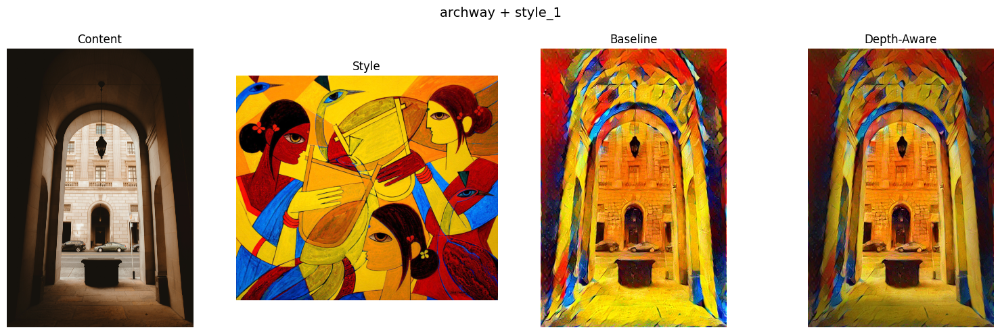

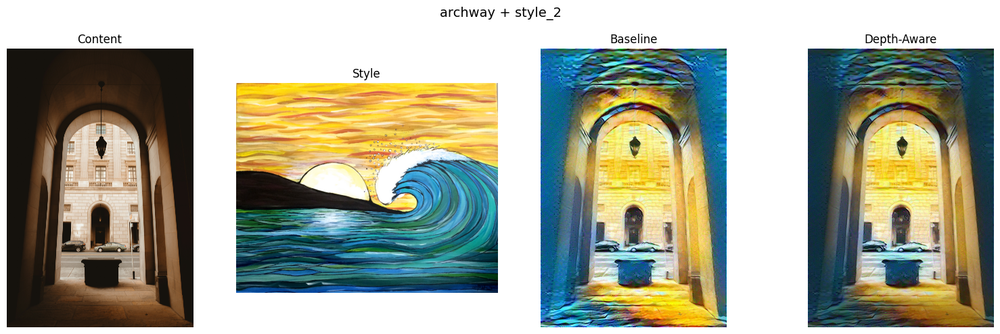

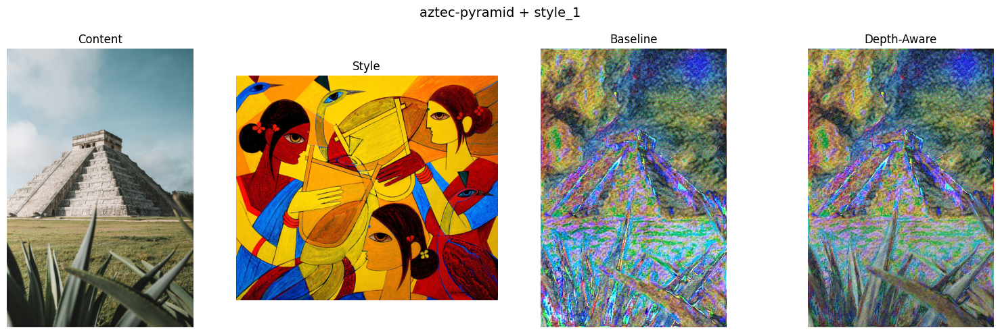

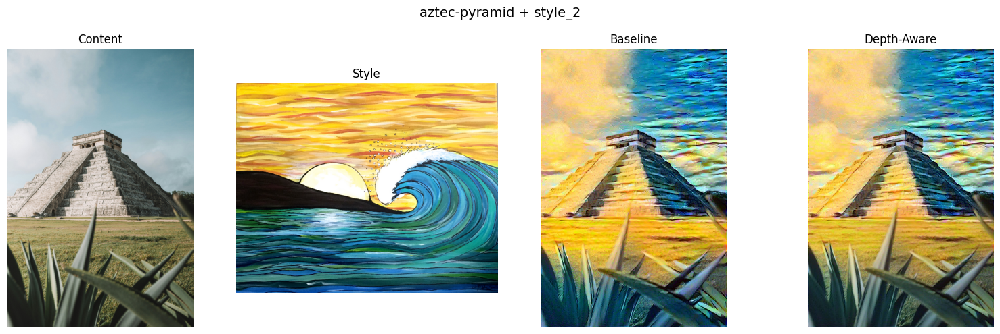

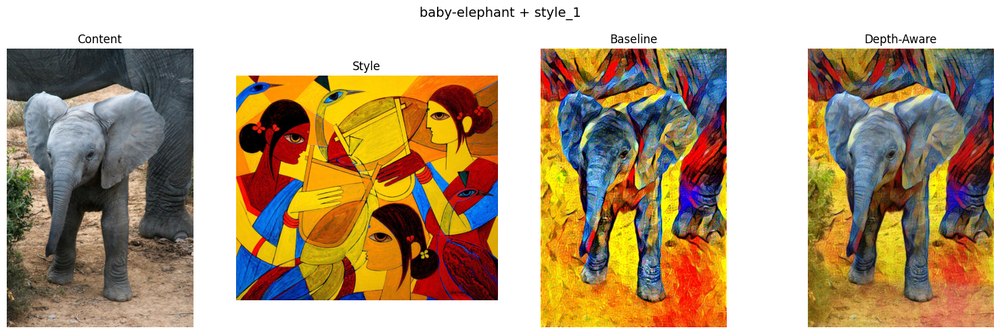

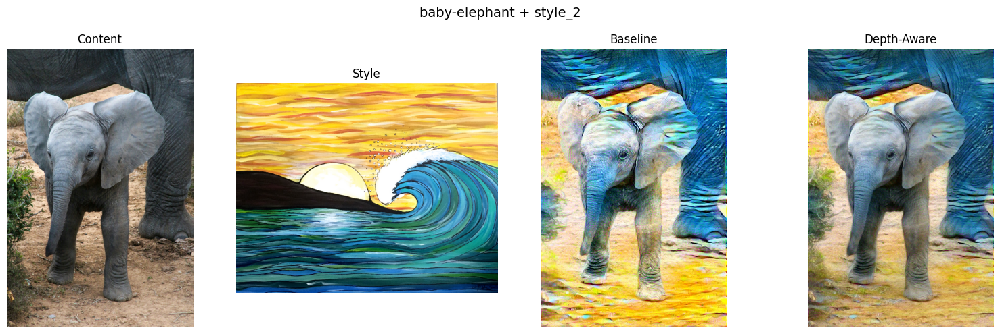

In [16]:
# Display sample results: Baseline vs Depth-Aware comparison

def show_comparison(content_name, style_name, figsize=(16, 5)):
    """Display original, baseline, and depth-aware results side by side."""
    combo_name = f"{content_name}__{style_name}"

    content_path = os.path.join(IMAGES_DIR, f"{content_name}.jpg")
    if not os.path.exists(content_path):
        content_path = os.path.join(IMAGES_DIR, f"{content_name}.png")

    style_path_full = os.path.join(STYLES_DIR, f"{style_name}.jpg")
    if not os.path.exists(style_path_full):
        style_path_full = os.path.join(STYLES_DIR, f"{style_name}.png")

    baseline_path = os.path.join(RESULTS_DIR, 'baseline', f"{combo_name}.jpg")
    depth_path = os.path.join(RESULTS_DIR, 'depth_aware', f"{combo_name}.jpg")

    fig, axes = plt.subplots(1, 4, figsize=figsize)

    # Original content
    if os.path.exists(content_path):
        axes[0].imshow(Image.open(content_path))
        axes[0].set_title('Content')
    axes[0].axis('off')

    # Style
    if os.path.exists(style_path_full):
        axes[1].imshow(Image.open(style_path_full))
        axes[1].set_title('Style')
    axes[1].axis('off')

    # Baseline
    if os.path.exists(baseline_path):
        axes[2].imshow(Image.open(baseline_path))
        axes[2].set_title('Baseline')
    else:
        axes[2].text(0.5, 0.5, 'Not found', ha='center', va='center')
    axes[2].axis('off')

    # Depth-aware
    if os.path.exists(depth_path):
        axes[3].imshow(Image.open(depth_path))
        axes[3].set_title('Depth-Aware')
    else:
        axes[3].text(0.5, 0.5, 'Not found', ha='center', va='center')
    axes[3].axis('off')

    plt.suptitle(f'{content_name} + {style_name}', fontsize=14)
    plt.tight_layout()
    plt.show()

# Show a few sample comparisons
print("Sample Results:")

# Get first few content and style names
sample_contents = [os.path.splitext(os.path.basename(f))[0] for f in content_files[:3]]
sample_styles = [os.path.splitext(os.path.basename(f))[0] for f in style_files[:2]]

for content_name in sample_contents:
    for style_name in sample_styles:
        show_comparison(content_name, style_name)

In [12]:
# Download results as zip (for Colab)
import shutil

# Create zip file of results
zip_path = shutil.make_archive('results', 'zip', '.', 'results')
print(f"Created: {zip_path}")

# Download in Colab
try:
    from google.colab import files
    files.download('results.zip')
    print("Download started!")
except ImportError:
    print("Not running in Colab - zip file saved locally")

Created: c:\Users\quate\Documents\UIUC MCS\UIUC OMCS\Sem 1\CS445\CS445_FinalProject\results.zip
Not running in Colab - zip file saved locally


torch: 2.9.1+cu126
cuda available: True
torch cuda: 12.6
device: cuda
gpu: NVIDIA GeForce RTX 4070 Ti
eval device: cuda
eval gpu: NVIDIA GeForce RTX 4070 Ti
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: c:\Users\quate\Documents\UIUC MCS\UIUC OMCS\Sem 1\CS445\CS445_FinalProject\.venv\Lib\site-packages\lpips\weights\v0.1\alex.pth
Saved metrics to eval.csv (1000 rows).


,variant,content,style,ssim,psnr,mse,mae,style_to_content,content_loss,style_loss,boundary_artifact,lpips,path
0,Baseline,archway,style_1,0.195814,8.445093,0.143008,0.288235,0.000072,5.774427,0.000414,NaN,0.747770,results\baseline\archway__style_1.jpg
1,Baseline,archway,style_2,0.261090,9.664977,0.107846,0.267487,0.000027,3.751862,0.000101,NaN,0.716144,results\baseline\archway__style_2.jpg
2,Baseline,archway,style_3,0.087250,7.058234,0.196922,0.373163,0.000080,5.364561,0.000430,NaN,0.765713,results\baseline\archway__style_3.jpg
3,Baseline,archway,style_4,0.547124,18.874790,0.012678,0.089069,0.000032,2.922090,0.000092,NaN,0.545732,results\baseline\archway__style_4.jpg
4,Baseline,archway,style_5,0.206459,8.977834,0.126287,0.298681,0.000073,4.473423,0.000327,NaN,0.680683,results\baseline\archway__style_5.jpg


,ssim,psnr,mse,mae,style_to_content,boundary_artifact
variant,,,,,,
Baseline,0.225025,10.514425,0.109706,0.258111,0.000140,NaN
Depth-aware,0.408662,13.620877,0.058144,0.174911,0.000222,45.079465


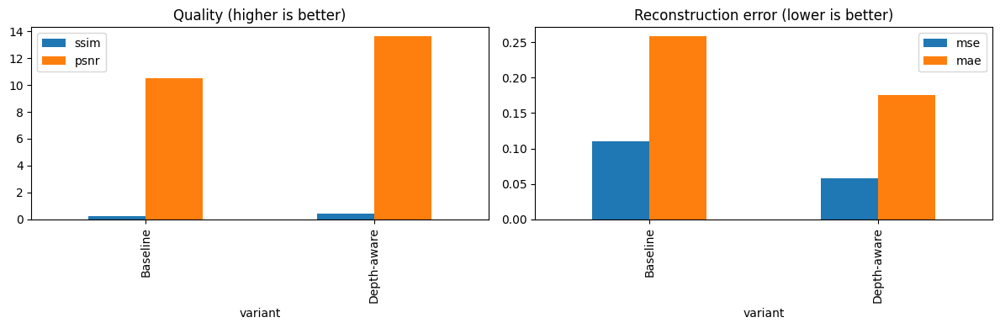

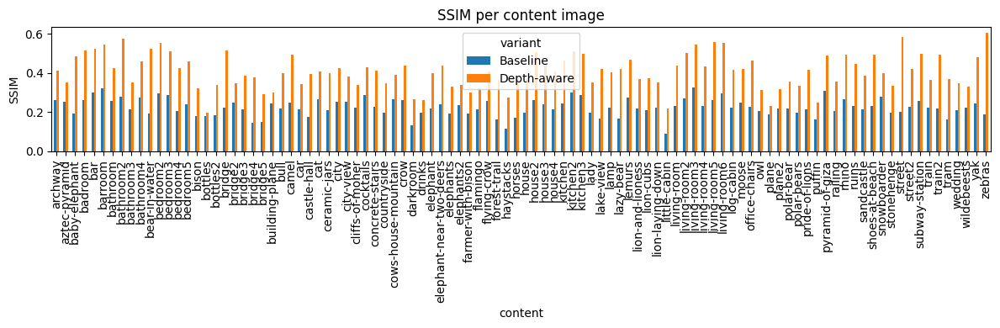

In [17]:
# EVALUATION: Baseline vs Depth-Aware metrics (full dataset)


DATA_DIR = 'data'
IMAGES_DIR = os.path.join(DATA_DIR, 'images')
STYLES_DIR = os.path.join(DATA_DIR, 'styles')
MASKS_DIR = os.path.join(DATA_DIR, 'masks')
RESULTS_DIR = 'results'
from pathlib import Path

print("torch:", torch.__version__)
print("cuda available:", torch.cuda.is_available())
print("torch cuda:", torch.version.cuda)
print("device:", device)
if device.type == "cuda":
    print("gpu:", torch.cuda.get_device_name(0))

# Evaluation-specific toggles to keep VRAM low
EVAL_DEVICE = torch.device("cuda")  
EVAL_MAX_SIZE = 768  # resize long side for metrics; set None for full resolution
COMPUTE_LPIPS = True  
EVAL_CSV = 'eval.csv'

print("eval device:", EVAL_DEVICE)
if EVAL_DEVICE.type == "cuda":
    if torch.cuda.is_available():
        print("eval gpu:", torch.cuda.get_device_name(0))
    else:
        print("eval device set to CUDA but no GPU is visible.")

def find_image(base_dir: str, stem: str):
    """Return the first existing image path for the given stem."""
    for ext in ('jpg', 'png', 'jpeg'):
        path = os.path.join(base_dir, f"{stem}.{ext}")
        if os.path.exists(path):
            return path
    return None

def to_float_np(path: str, target_shape=None, max_size=None):
    img = Image.open(path).convert('RGB')
    if target_shape and img.size != (target_shape[1], target_shape[0]):
        img = img.resize((target_shape[1], target_shape[0]), Image.LANCZOS)
    elif max_size and max(img.size) > max_size:
        scale = max_size / max(img.size)
        new_size = (max(1, int(img.size[0] * scale)), max(1, int(img.size[1] * scale)))
        img = img.resize(new_size, Image.LANCZOS)
    arr = np.array(img).astype(np.float32) / 255.0
    return arr

def img_to_tensor(path: str, target_shape=None, device=EVAL_DEVICE, max_size=None):
    """Load image -> float tensor [1,3,H,W] on device in [0,1]."""
    img = Image.open(path).convert("RGB")
    if target_shape and img.size != (target_shape[1], target_shape[0]):
        img = img.resize((target_shape[1], target_shape[0]), Image.LANCZOS)
    elif max_size and max(img.size) > max_size:
        scale = max_size / max(img.size)
        new_size = (max(1, int(img.size[0] * scale)), max(1, int(img.size[1] * scale)))
        img = img.resize(new_size, Image.LANCZOS)
    arr = np.array(img).astype(np.float32) / 255.0  # HWC
    t = torch.from_numpy(arr).permute(2, 0, 1).unsqueeze(0)  # 1CHW
    return t.to(device)

# Optional: set up LPIPS on the right device (only if you enable it)
lpips_model = None
if COMPUTE_LPIPS:
    try:
        lpips_model = load_lpips_model(net="alex", device_override=EVAL_DEVICE)
    except Exception as e:
        print("LPIPS requested but could not be initialized:", e)
        lpips_model = None
        COMPUTE_LPIPS = False

rows = []
baseline_paths = sorted(glob.glob(os.path.join(RESULTS_DIR, 'baseline', '*.jpg')))
depth_paths = sorted(glob.glob(os.path.join(RESULTS_DIR, 'depth_aware', '*.jpg')))

if not baseline_paths and not depth_paths:
    print('No results found; run the generation cells first.')

for variant, paths in [('Baseline', baseline_paths), ('Depth-aware', depth_paths)]:
    for stylized_path in paths:
        combo = Path(stylized_path).stem
        if '__' in combo:
            content_name, style_name = combo.split('__', 1)
        else:
            content_name, style_name = combo, 'unknown'

        content_path = find_image(IMAGES_DIR, content_name)
        style_path = find_image(STYLES_DIR, style_name)
        if not content_path or not style_path:
            print(f"Skipping {combo}: missing content/style file.")
            continue

        stylized_img = Image.open(stylized_path).convert('RGB')
        h, w = stylized_img.size[1], stylized_img.size[0]
        target_shape = (h, w)
        if EVAL_MAX_SIZE and max(h, w) > EVAL_MAX_SIZE:
            scale = EVAL_MAX_SIZE / max(h, w)
            target_shape = (max(1, int(h * scale)), max(1, int(w * scale)))

        mask = None
        if variant == 'Depth-aware':
            try:
                mask = load_precomputed_masks(
                    MASKS_DIR,
                    content_name,
                    target_shape=target_shape,
                    feather_radius=FEATHER_RADIUS
                )
            except Exception as e:
                print(f"Warning: could not load masks for {content_name}: {e}")

        # ---- Metric evaluation (uses eval.py device overrides) ----
        metrics = evaluate_stylization(
            stylized_path,
            content_path,
            style_path,
            depth_masks=mask,
            compute_lpips_metric=COMPUTE_LPIPS,
            lpips_model=lpips_model,
            device_override=EVAL_DEVICE,
            max_size=EVAL_MAX_SIZE
        )

        # ---- MSE/MAE: GPU if available, else CPU ----
        if EVAL_DEVICE.type == "cuda" and torch.cuda.is_available():
            with torch.no_grad():
                styl_t = img_to_tensor(
                    stylized_path,
                    target_shape=target_shape,
                    device=EVAL_DEVICE,
                    max_size=EVAL_MAX_SIZE,
                )
                cont_t = img_to_tensor(
                    content_path,
                    target_shape=target_shape,
                    device=EVAL_DEVICE,
                    max_size=EVAL_MAX_SIZE,
                )
                diff = styl_t - cont_t
                mse = float((diff * diff).mean().item())
                mae = float(diff.abs().mean().item())
        else:
            content_np = to_float_np(content_path, target_shape=target_shape, max_size=EVAL_MAX_SIZE)
            stylized_np = to_float_np(stylized_path, target_shape=target_shape, max_size=EVAL_MAX_SIZE)
            mse = float(np.mean((stylized_np - content_np) ** 2))
            mae = float(np.mean(np.abs(stylized_np - content_np)))

        style_content = metrics['style_content']
        boundary = None
        if metrics.get('depth_layers'):
            boundary_scores = [
                layer['boundary_artifact']
                for layer in metrics['depth_layers'].values()
                if 'boundary_artifact' in layer
            ]
            if boundary_scores:
                boundary = float(np.mean(boundary_scores))

        rows.append({
            'variant': variant,
            'content': content_name,
            'style': style_name,
            'ssim': metrics['ssim'],
            'psnr': metrics['psnr'],
            'mse': mse,
            'mae': mae,
            'style_to_content': style_content['style_to_content'],
            'content_loss': style_content['content_loss'],
            'style_loss': style_content['style_loss'],
            'boundary_artifact': boundary,
            'lpips': metrics.get('lpips'),
            'path': stylized_path,
        })

df = pd.DataFrame(rows)
if not df.empty:
    df.to_csv(EVAL_CSV, index=False)
    print(f"Saved metrics to {EVAL_CSV} ({len(df)} rows).")
    display(df.head())

    summary = df.groupby('variant')[['ssim', 'psnr', 'mse', 'mae', 'style_to_content', 'boundary_artifact']].mean()
    display(summary)

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    summary[['ssim', 'psnr']].plot(kind='bar', ax=axes[0], title='Quality (higher is better)')
    summary[['mse', 'mae']].plot(kind='bar', ax=axes[1], title='Reconstruction error (lower is better)')
    plt.tight_layout()
    plt.show()

    pivot = df.pivot_table(index='content', columns='variant', values='ssim')
    pivot.plot(kind='bar', figsize=(12, 4), title='SSIM per content image')
    plt.ylabel('SSIM')
    plt.tight_layout()
    plt.show()
else:
    print('No metrics computed; check that results exist.')


In [8]:
# Wipe cache of device and existing memory
if device.type == "cuda":
    torch.cuda.empty_cache()
    torch.cuda.reset_max_memory_allocated()
    torch.cuda.reset_max_memory_cached()
    print("Cleared CUDA cache and reset memory stats.")

Cleared CUDA cache and reset memory stats.


c:\Users\quate\Documents\UIUC MCS\UIUC OMCS\Sem 1\CS445\CS445_FinalProject\.venv\Lib\site-packages\torch\cuda\memory.py:491: FutureWarning: torch.cuda.reset_max_memory_allocated now calls torch.cuda.reset_peak_memory_stats, which resets /all/ peak memory stats.
  warnings.warn(
c:\Users\quate\Documents\UIUC MCS\UIUC OMCS\Sem 1\CS445\CS445_FinalProject\.venv\Lib\site-packages\torch\cuda\memory.py:517: FutureWarning: torch.cuda.reset_max_memory_cached now calls torch.cuda.reset_peak_memory_stats, which resets /all/ peak memory stats.
  warnings.warn(
